# Predicting whether a customer will change telecommunications provider

Data available at kaggle

|Anne|Zuri|
|----|------|
|Walter|Nathaniel|

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import sweetviz
import autoviz
import warnings

%matplotlib inline
warnings.filterwarnings('ignore')

In [35]:
df1 = pd.read_csv('train.csv')
df2 = pd.read_csv('test.csv')

In [36]:
train, test = df1, df2

In [4]:
train.head(3)

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,no
1,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,no
2,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no


In [5]:
train.shape

(4250, 20)

In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4250 entries, 0 to 4249
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          4250 non-null   object 
 1   account_length                 4250 non-null   int64  
 2   area_code                      4250 non-null   object 
 3   international_plan             4250 non-null   object 
 4   voice_mail_plan                4250 non-null   object 
 5   number_vmail_messages          4250 non-null   int64  
 6   total_day_minutes              4250 non-null   float64
 7   total_day_calls                4250 non-null   int64  
 8   total_day_charge               4250 non-null   float64
 9   total_eve_minutes              4250 non-null   float64
 10  total_eve_calls                4250 non-null   int64  
 11  total_eve_charge               4250 non-null   float64
 12  total_night_minutes            4250 non-null   f

In [7]:
train.index

RangeIndex(start=0, stop=4250, step=1)

In [8]:
train.columns

Index(['state', 'account_length', 'area_code', 'international_plan',
       'voice_mail_plan', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'churn'],
      dtype='object')

In [9]:
train.isna().sum()

state                            0
account_length                   0
area_code                        0
international_plan               0
voice_mail_plan                  0
number_vmail_messages            0
total_day_minutes                0
total_day_calls                  0
total_day_charge                 0
total_eve_minutes                0
total_eve_calls                  0
total_eve_charge                 0
total_night_minutes              0
total_night_calls                0
total_night_charge               0
total_intl_minutes               0
total_intl_calls                 0
total_intl_charge                0
number_customer_service_calls    0
churn                            0
dtype: int64

In [10]:
train.duplicated().sum()

0

Assumptions about our data on **Data Quality Framework**;
- It is accurate
- It is timeliness **variety**
- It is consistent **each entry is made up of independent, identically and distributed observations iid**
- It is unique **each entry is unique in the sense that it doesn't have duplicates**
- It is complete **it doesn't have null values**

## Data Exploration

In [11]:
EDA = open('Description.txt', 'r')
print(EDA.read())

This competition is about predicting whether a customer will change telecommunications provider, something known as "churning".

The training dataset contains 4250 samples. Each sample contains 19 features and 1 boolean variable "churn" which indicates the class of the sample. The 19 input features and 1 target variable are:

"state", string. 2-letter code of the US state of customer residence
"account_length", numerical. Number of months the customer has been with the current telco provider
"area_code", string="area_code_AAA" where AAA = 3 digit area code.
"international_plan", . The customer has international plan.
"voice_mail_plan", . The customer has voice mail plan.
"number_vmail_messages", numerical. Number of voice-mail messages.
"total_day_minutes", numerical. Total minutes of day calls.
"total_day_calls", numerical. Total minutes of day calls.
"total_day_charge", numerical. Total charge of day calls.
"total_eve_minutes", numerical. Total minutes of evening calls.
"total_eve_ca

### Summary Statistics

In [12]:
train.describe()

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
count,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000
mean,100.236235,7.631765,180.259600,99.907294,30.644682,200.173906,100.176471,17.015012,200.527882,99.839529,9.023892,10.256071,4.426353,2.769654,1.559059
std,39.698401,13.439882,54.012373,19.850817,9.182096,50.249518,19.908591,4.271212,50.353548,20.093220,2.265922,2.760102,2.463069,0.745204,1.311434
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,73.000000,0.000000,143.325000,87.000000,24.365000,165.925000,87.000000,14.102500,167.225000,86.000000,7.522500,8.500000,3.000000,2.300000,1.000000
50%,100.000000,0.000000,180.450000,100.000000,30.680000,200.700000,100.000000,17.060000,200.450000,100.000000,9.020000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,16.000000,216.200000,113.000000,36.750000,233.775000,114.000000,19.867500,234.700000,113.000000,10.560000,12.000000,6.000000,3.240000,2.000000
max,243.000000,52.000000,351.500000,165.000000,59.760000,359.300000,170.000000,30.540000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


#### Extracting the mean and median for column data to check for skewness

If;
- Mean < Median < Mode (**means data is skewed to the left**)
- Mean > Median > Mode (**means data is skewed to the right**)
- Mean = Median = Mode (**means data is normally distributed i.e data has no skewness hence symetrical**)

In [13]:
miu = train.mean().reset_index()
miu.rename(columns={'index':'Columns', 0:'Mean'}, inplace=True)
miu['Std'] = train.std().values
miu['Median'] = train.median().values
miu

,Columns,Mean,Std,Median
0,account_length,100.236235,39.698401,100.00
1,number_vmail_messages,7.631765,13.439882,0.00
2,total_day_minutes,180.259600,54.012373,180.45
3,total_day_calls,99.907294,19.850817,100.00
4,total_day_charge,30.644682,9.182096,30.68
5,total_eve_minutes,200.173906,50.249518,200.70
6,total_eve_calls,100.176471,19.908591,100.00
7,total_eve_charge,17.015012,4.271212,17.06
8,total_night_minutes,200.527882,50.353548,200.45
9,total_night_calls,99.839529,20.093220,100.00


From the above mean and median, we can deduce that the mean and median for most of our columns are almost equal. This tells us that our data must be exhibiting a gaussian distribution if not normally distributed. This tells us that our data is neither skewed either to the left nor to the right but symetrical about the mean.

In [14]:
px.bar(miu.sort_values(by='Mean', ascending=False).head(10), 
       y='Mean', 
       x='Columns', 
       hover_name='Std', 
       color='Mean', 
       title='10 Highest Column Means')

In [15]:
train.describe(include='O')

,state,area_code,international_plan,voice_mail_plan,churn
count,4250,4250,4250,4250,4250
unique,51,3,2,2,2
top,WV,area_code_415,no,no,no
freq,139,2108,3854,3138,3652


Here we can see the categorical columns with the highest frequency

In [16]:
state_freq = train.state.value_counts().reset_index()
state_freq.rename(columns={'index':'State', 'state':'Frequency'}, inplace=True)
state_freq['Percent'] =(state_freq['Frequency'].values/state_freq['Frequency'].sum())*100
state_freq.head()

,State,Frequency,Percent
0,WV,139,3.270588
1,MN,108,2.541176
2,ID,106,2.494118
3,AL,101,2.376471
4,VA,100,2.352941


In [17]:
px.bar(state_freq.head(10), 
       y='Frequency', 
       x='State', 
       hover_name='Percent', 
       color='State', 
       title='Top 10 Frequent States')

<AxesSubplot:title={'center':'Distribution of Total minutes of international calls'}, ylabel='Density'>

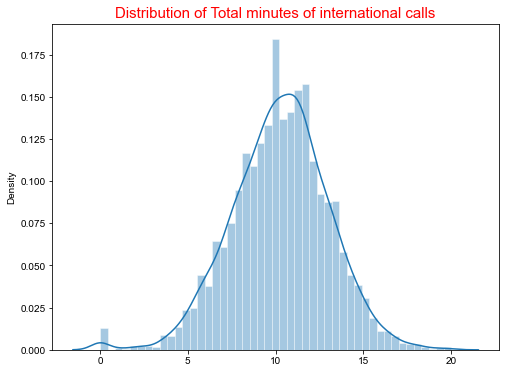

In [18]:
plt.figure(figsize=(8,6))
plt.title('Distribution of Total minutes of international calls', fontsize=15, color='red')
sns.set_theme()
sns.distplot(x=train['total_intl_minutes'])

<AxesSubplot:title={'center':'Distribution of Total charge of international calls'}, ylabel='Density'>

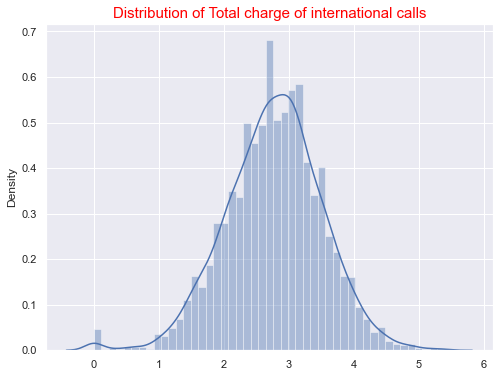

In [19]:
plt.figure(figsize=(8,6))
plt.title('Distribution of Total charge of international calls', fontsize=15, color='red')
sns.set_theme()
sns.distplot(x=train['total_intl_charge'])

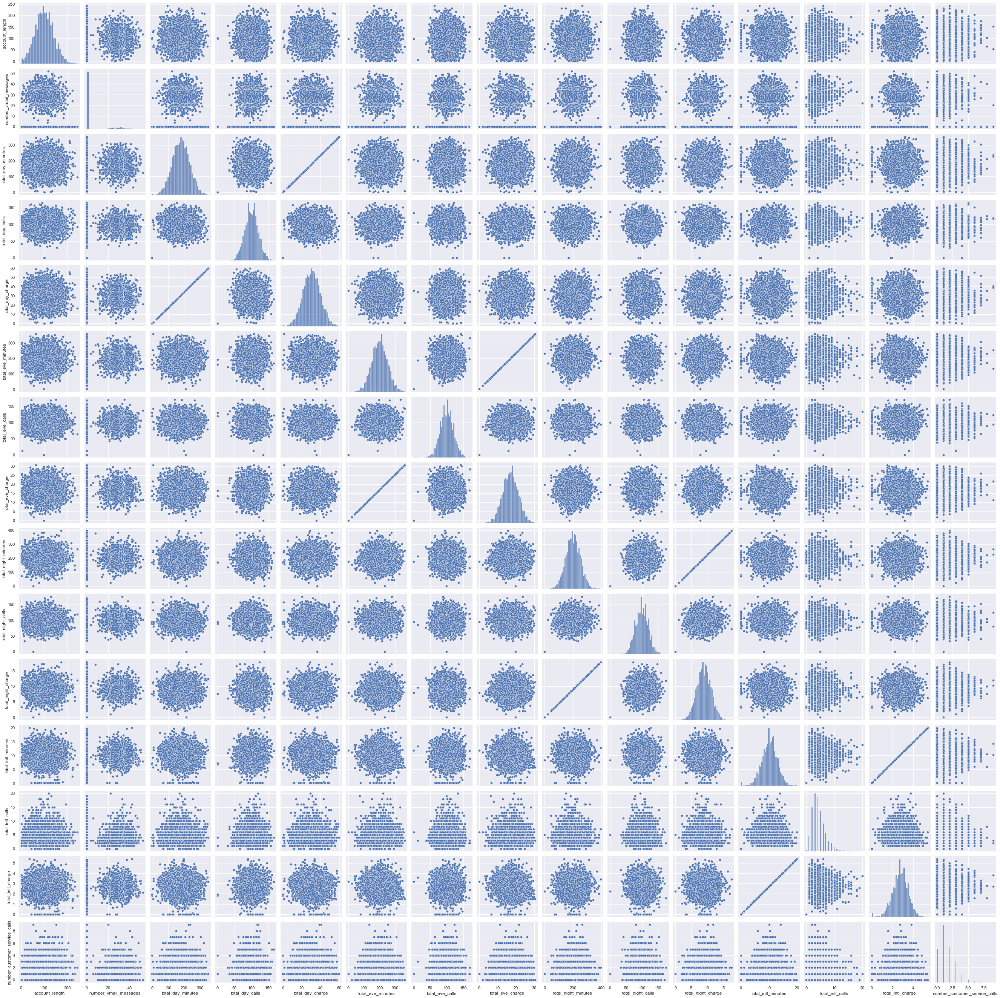

In [20]:
sns.pairplot(train)

In [21]:
train.columns

Index(['state', 'account_length', 'area_code', 'international_plan',
       'voice_mail_plan', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'churn'],
      dtype='object')

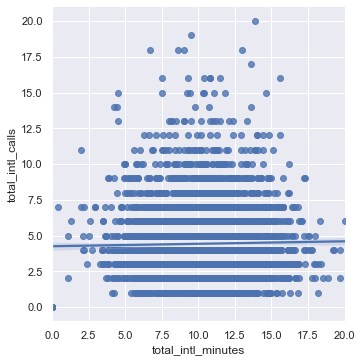

In [22]:
sns.lmplot(data=train, x='total_intl_minutes', y='total_intl_calls') #linear regression plot

<AxesSubplot:xlabel='total_night_charge', ylabel='total_intl_calls'>

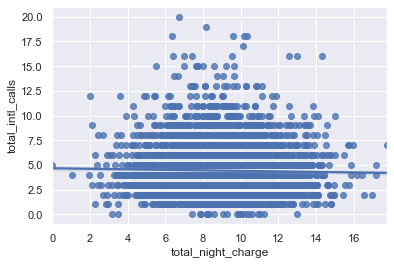

In [23]:
sns.regplot(data=train, x='total_night_charge', y='total_intl_calls') #regression plot

In [24]:
train.dtypes

state                             object
account_length                     int64
area_code                         object
international_plan                object
voice_mail_plan                   object
number_vmail_messages              int64
total_day_minutes                float64
total_day_calls                    int64
total_day_charge                 float64
total_eve_minutes                float64
total_eve_calls                    int64
total_eve_charge                 float64
total_night_minutes              float64
total_night_calls                  int64
total_night_charge               float64
total_intl_minutes               float64
total_intl_calls                   int64
total_intl_charge                float64
number_customer_service_calls      int64
churn                             object
dtype: object


Report report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



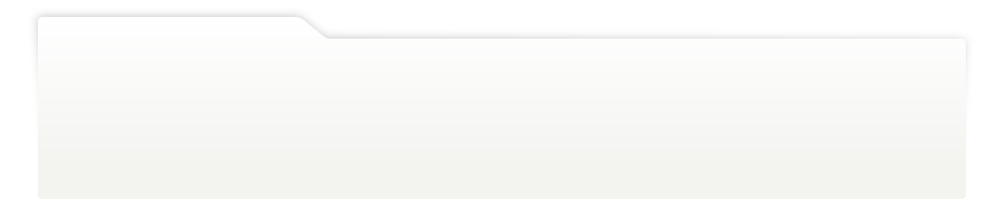
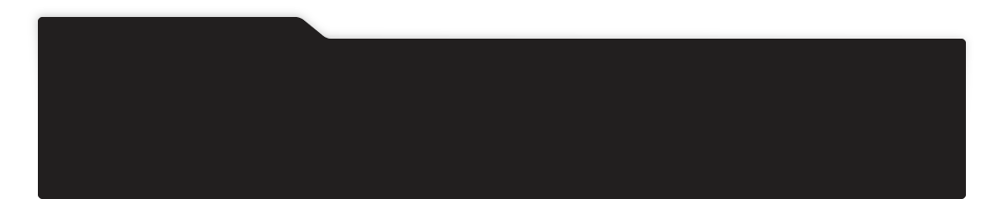
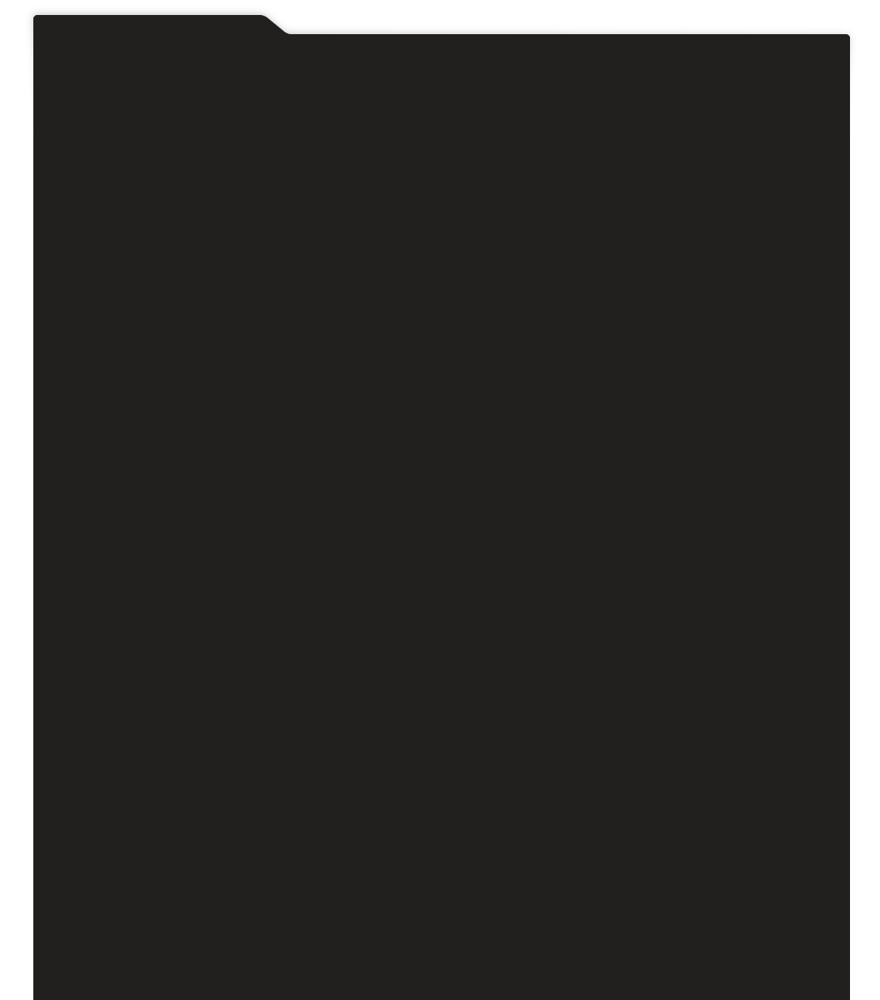
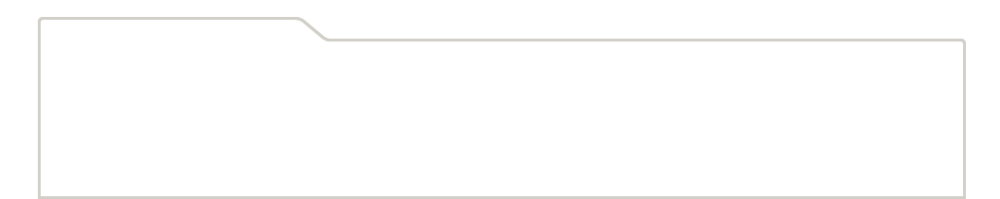
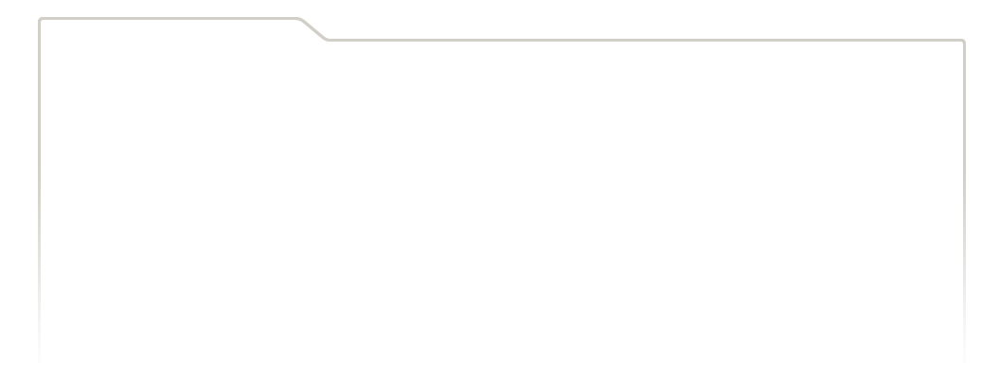
...
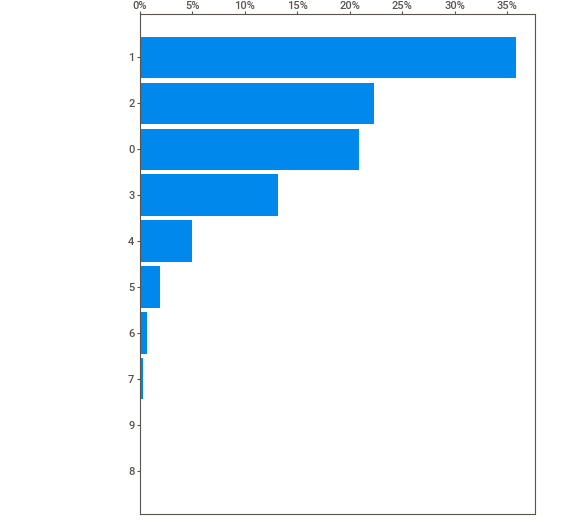
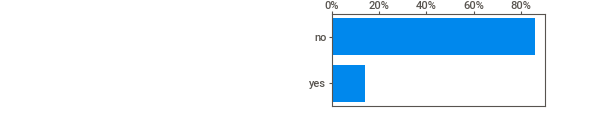
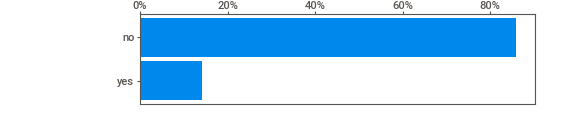
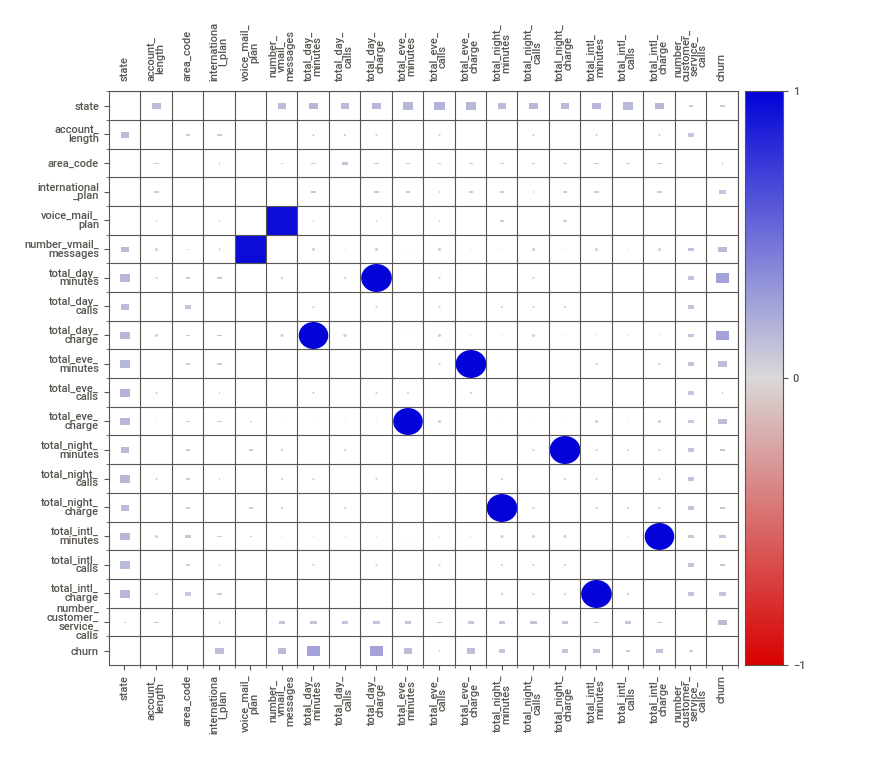
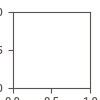

In [25]:
report= sweetviz.analyze(train)
report.show_html('report.html')
report.show_notebook()

In [31]:
from autoviz.AutoViz_Class import AutoViz_Class

Imported AutoViz_Class. Call by using AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)


Shape of your Data Set: (4250, 20)
Classifying variables in data set...
    20 Predictors classified...
        This does not include the Target column(s)
    1 variables removed since they were ID or low-information variables
Number of All Scatter Plots = 36
Number of Categorical and Continuous Vars exceeds limit, hence no Bar Plots
Time to run AutoViz (in seconds) = 38.579


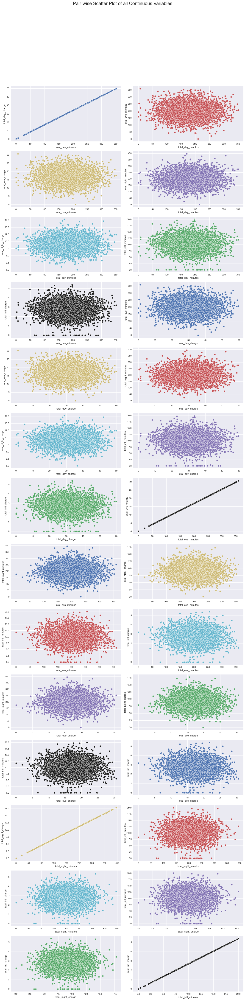

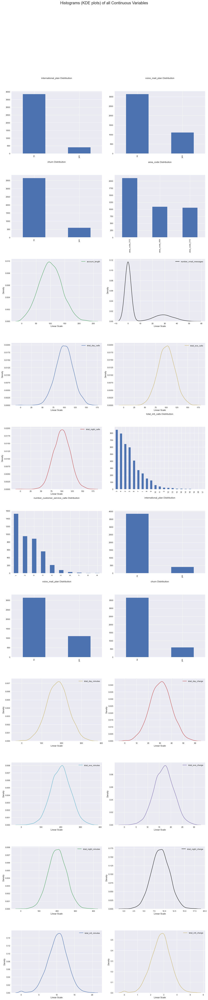

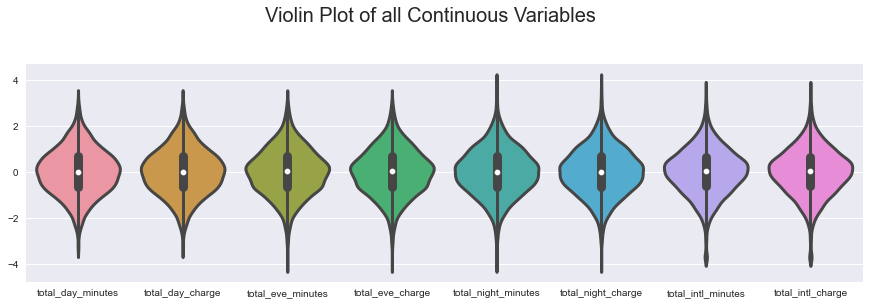

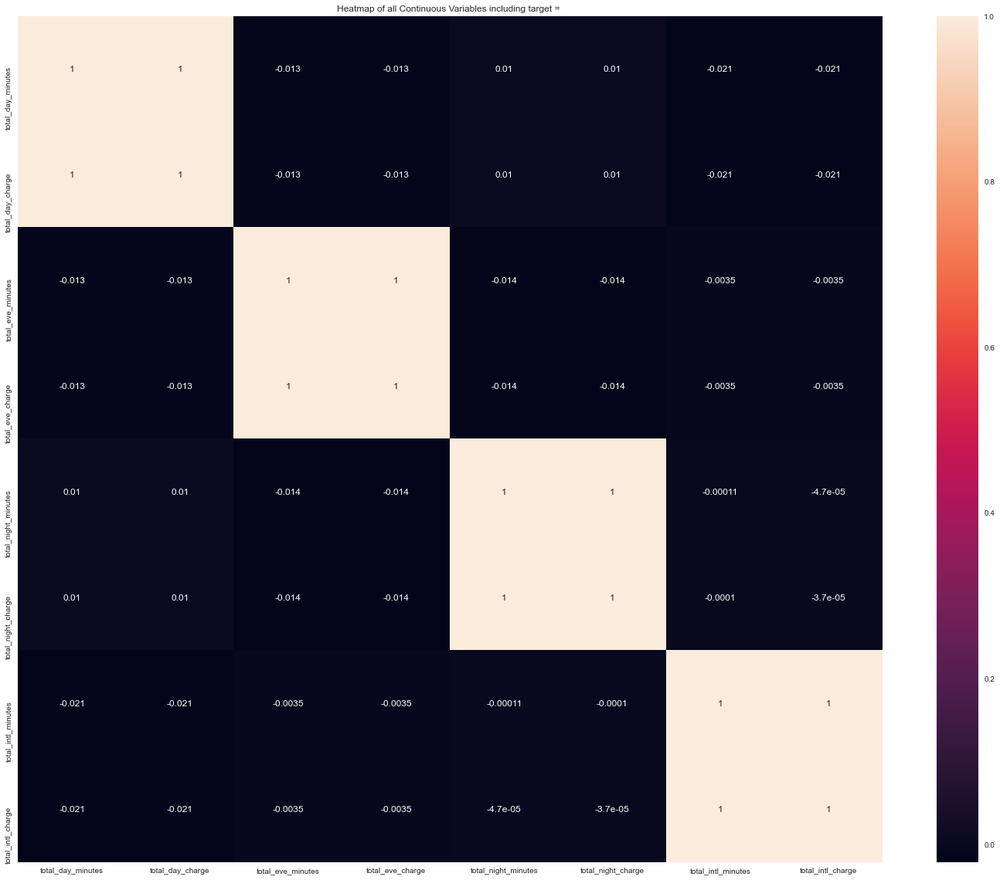

In [40]:
av=AutoViz_Class()
autoviz_eda=av.AutoViz('train.csv',verbose=0)

###### converting string labels into numerical ones
<font color='red'>changing the columns with object(string like or alpha numeric or dates etc)data types into columns with numerical data.</font>

In [41]:
trainn = train.copy()

In [42]:
testt = test.copy()

In [56]:
from sklearn import preprocessing # label encoder
le = preprocessing.LabelEncoder() # instantiating/creating the label encoder

# encoding them
trainn.state = le.fit_transform(trainn.state)
trainn.area_code = le.fit_transform(trainn.area_code)
trainn.international_plan = le.fit_transform(trainn.international_plan)
trainn.voice_mail_plan = le.fit_transform(trainn.voice_mail_plan)
trainn.churn = le.fit_transform(trainn.churn)

**for test data**

In [44]:
test.shape

(750, 20)

In [45]:
train.shape

(4250, 20)

In [46]:
trainn.sample(4)

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
616,22,101,2,0,0,0,190.7,72,32.42,208.6,103,17.73,203.8,111,9.17,8.8,8,2.38,1,0
408,21,92,1,1,0,0,130.7,113,22.22,260.6,122,22.15,244.2,98,10.99,9.4,2,2.54,2,1
10,12,168,0,0,0,0,128.8,96,21.90,104.9,71,8.92,141.1,128,6.35,11.2,2,3.02,1,0
4156,23,133,1,0,0,0,128.9,85,21.91,201.4,93,17.12,275.3,103,12.39,11.1,3,3.00,1,0


In [47]:
x = trainn.drop('churn',axis='columns')
y = trainn[['churn']]

## Machine Learning Classifiers

- [ ] Naive Bayes
- [ ] XGB Classifier
- [ ] AdaBoost Classifier
- [ ] Gradient Boosting Classifier
- [ ] Support Vector Machine
- [ ] Logistic Regression
- [ ] Random Forest Classifier
- [ ] KNeareastNeighbors
- [ ] Stacking Classifier

In [96]:
from sklearn.metrics import classification_report, confusion_matrix

**Naive Bayes**

In [98]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=102)

In [140]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X_train, y_train)

y_pred = gnb.predict(X_test)

In [143]:
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[695  44]
 [ 45  66]]
              precision    recall  f1-score   support

           0       0.94      0.94      0.94       739
           1       0.60      0.59      0.60       111

    accuracy                           0.90       850
   macro avg       0.77      0.77      0.77       850
weighted avg       0.89      0.90      0.90       850



**XGB Classifier**

In [145]:
from xgboost import XGBRFClassifier
xgb_model = XGBRFClassifier()
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=102)
xgb_model.fit(X_train, y_train)
xgb_model_preds = xgb_model.predict(X_test)

print(confusion_matrix(y_test, xgb_model_preds))
print(classification_report(y_test, xgb_model_preds))

[00:27:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[737   2]
 [ 36  75]]
              precision    recall  f1-score   support

           0       0.95      1.00      0.97       739
           1       0.97      0.68      0.80       111

    accuracy                           0.96       850
   macro avg       0.96      0.84      0.89       850
weighted avg       0.96      0.96      0.95       850



**AdaBoostClassifier**

In [146]:
from sklearn.ensemble import AdaBoostClassifier
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=102)
ABC = AdaBoostClassifier(n_estimators = 9)
ABC.fit(X_train, y_train)
ABC_preds = ABC.predict(X_test)

print(confusion_matrix(y_test, ABC_preds))
print(classification_report(y_test, ABC_preds))

[[715  24]
 [ 72  39]]
              precision    recall  f1-score   support

           0       0.91      0.97      0.94       739
           1       0.62      0.35      0.45       111

    accuracy                           0.89       850
   macro avg       0.76      0.66      0.69       850
weighted avg       0.87      0.89      0.87       850



**Gradient Boosting Classifier**

In [147]:
from sklearn.ensemble import GradientBoostingClassifier
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=102)
GBC = GradientBoostingClassifier(n_estimators=15)
GBC.fit(X_train, y_train)
GBC_preds = GBC.predict(X_test)

print(confusion_matrix(y_test, GBC_preds))
print(classification_report(y_test, GBC_preds))

[[736   3]
 [ 63  48]]
              precision    recall  f1-score   support

           0       0.92      1.00      0.96       739
           1       0.94      0.43      0.59       111

    accuracy                           0.92       850
   macro avg       0.93      0.71      0.77       850
weighted avg       0.92      0.92      0.91       850



**Support Vector Machine**

In [58]:
from sklearn.model_selection import train_test_split
from sklearn import svm

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=102)
clf = svm.SVC()
clf.fit(X_train, y_train)

preds = clf.predict(X_test)

In [148]:
print(confusion_matrix(y_test, preds))
print(classification_report(y_test, preds))

[[739   0]
 [108   3]]
              precision    recall  f1-score   support

           0       0.87      1.00      0.93       739
           1       1.00      0.03      0.05       111

    accuracy                           0.87       850
   macro avg       0.94      0.51      0.49       850
weighted avg       0.89      0.87      0.82       850



**Logistic Regression**

In [60]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=102)
lgmodel = LogisticRegression()
lgmodel.fit(X_train, y_train)

ypred = lgmodel.predict(X_test)

In [149]:
print(confusion_matrix(y_test, ypred))
print(classification_report(y_test, ypred))

[[728  11]
 [102   9]]
              precision    recall  f1-score   support

           0       0.88      0.99      0.93       739
           1       0.45      0.08      0.14       111

    accuracy                           0.87       850
   macro avg       0.66      0.53      0.53       850
weighted avg       0.82      0.87      0.82       850



**Random Forest Classifier**

In [157]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=102)
rfc = RandomForestClassifier()
rfc.fit(X_train, y_train)

ypredss = rfc .predict(X_test)

print(confusion_matrix(y_test, ypredss))
print(classification_report(y_test, ypredss))

[[736   3]
 [ 29  82]]
              precision    recall  f1-score   support

           0       0.96      1.00      0.98       739
           1       0.96      0.74      0.84       111

    accuracy                           0.96       850
   macro avg       0.96      0.87      0.91       850
weighted avg       0.96      0.96      0.96       850



**KNeareastNeighbors**

In [151]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=102, stratify=y)
knn = KNeighborsClassifier(n_neighbors=5)
knn .fit(X_train, y_train)

ypredss = knn.predict(X_test)

print(confusion_matrix(y_test, ypredss))
print(classification_report(y_test, ypredss))

[[719  11]
 [ 73  47]]
              precision    recall  f1-score   support

           0       0.91      0.98      0.94       730
           1       0.81      0.39      0.53       120

    accuracy                           0.90       850
   macro avg       0.86      0.69      0.74       850
weighted avg       0.89      0.90      0.89       850



In [152]:
knn = KNeighborsClassifier(n_neighbors=10)
knn .fit(X_train, y_train)

ypredss = knn.predict(X_test)

print(confusion_matrix(y_test, ypredss))
print(classification_report(y_test, ypredss))

[[729   1]
 [ 89  31]]
              precision    recall  f1-score   support

           0       0.89      1.00      0.94       730
           1       0.97      0.26      0.41       120

    accuracy                           0.89       850
   macro avg       0.93      0.63      0.67       850
weighted avg       0.90      0.89      0.87       850



In [153]:
knn = KNeighborsClassifier(n_neighbors=6)
knn .fit(X_train, y_train)

ypredss = knn.predict(X_test)

print(confusion_matrix(y_test, ypredss))
print(classification_report(y_test, ypredss))

[[728   2]
 [ 82  38]]
              precision    recall  f1-score   support

           0       0.90      1.00      0.95       730
           1       0.95      0.32      0.47       120

    accuracy                           0.90       850
   macro avg       0.92      0.66      0.71       850
weighted avg       0.91      0.90      0.88       850



In [154]:
knn = KNeighborsClassifier(n_neighbors=7)
knn .fit(X_train, y_train)

ypredss = knn.predict(X_test)

print(confusion_matrix(y_test, ypredss))
print(classification_report(y_test, ypredss))

[[724   6]
 [ 79  41]]
              precision    recall  f1-score   support

           0       0.90      0.99      0.94       730
           1       0.87      0.34      0.49       120

    accuracy                           0.90       850
   macro avg       0.89      0.67      0.72       850
weighted avg       0.90      0.90      0.88       850



**Stacking Classifier**

In [155]:
from sklearn.ensemble import StackingClassifier
sc_model = StackingClassifier(estimators=[('xgb', xgb_model), ('GBC', GBC), ('rf', rfc)])
sc_model.fit(X_train, y_train)
sc_pred = sc_model.predict(X_test)
print(confusion_matrix(y_test, sc_pred))
print(classification_report(y_test, sc_pred))

[00:53:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:54:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:54:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:54:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

# <font color='magenta'>Predicting using the Test Data</font>

In [69]:
trainn.columns

Index(['state', 'account_length', 'area_code', 'international_plan',
       'voice_mail_plan', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'churn'],
      dtype='object')

In [72]:
features = ['state', 
            'account_length', 
            'area_code', 
            'international_plan',
            'voice_mail_plan', 
            'number_vmail_messages', 
            'total_day_minutes',
            'total_day_calls', 
            'total_day_charge', 
            'total_eve_minutes',
            'total_eve_calls', 
            'total_eve_charge', 
            'total_night_minutes',
            'total_night_calls', 
            'total_night_charge', 
            'total_intl_minutes',
            'total_intl_calls', 
            'total_intl_charge',
            'number_customer_service_calls']

In [73]:
len(features)

19

In [76]:
for_X_train = pd.get_dummies(train[features])
for_y_train = train['churn']
final_X_test = pd.get_dummies(test[features])

### <font color='red'>We will use Random Forest Classifier since it has an accuracy of 96%</font>

In [78]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier()
rfc.fit(for_X_train, for_y_train)

ypredss = rfc .predict(final_X_test)

### Writting out the predicted CSV file

In [82]:
Output_Predictions = pd.DataFrame({'id':test.id, 
                                   'churn':ypredss})

In [83]:
Output_Predictions.to_csv('Anne&Walter.csv', index=False)

In [84]:
submission = pd.read_csv('Anne&Walter.csv')

In [91]:
submission.sample(7)

,id,churn
416,417,yes
655,656,no
61,62,no
62,63,yes
716,717,no
148,149,no
107,108,no
